# Importing the required libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
%matplotlib inline

In [2]:
df = pd.read_csv("rainfall_data_india_1901-2017.csv")
df.head()

,Name,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,...,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,June-September,Oct-Dec,Latitude,Longitude
0,ROW1,Andaman & Nicobar Islands,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,...,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3,12.61124,92.83165
1,ROW2,Andaman & Nicobar Islands,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,...,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7,12.61124,92.83165
2,ROW3,Andaman & Nicobar Islands,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,...,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6,12.61124,92.83165
3,ROW4,Andaman & Nicobar Islands,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,...,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0,12.61124,92.83165
4,ROW5,Andaman & Nicobar Islands,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,...,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8,12.61124,92.83165


# Data Exploration and Pre-Processing

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4187 entries, 0 to 4186
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Name            4187 non-null   object 
 1   SUBDIVISION     4187 non-null   object 
 2   YEAR            4187 non-null   int64  
 3   JAN             4187 non-null   float64
 4   FEB             4187 non-null   float64
 5   MAR             4187 non-null   float64
 6   APR             4187 non-null   float64
 7   MAY             4187 non-null   float64
 8   JUN             4187 non-null   float64
 9   JUL             4187 non-null   float64
 10  AUG             4187 non-null   float64
 11  SEP             4187 non-null   float64
 12  OCT             4187 non-null   float64
 13  NOV             4187 non-null   float64
 14  DEC             4187 non-null   float64
 15  ANNUAL          4187 non-null   float64
 16  Jan-Feb         4187 non-null   float64
 17  Mar-May         4187 non-null   f

In [4]:
df.describe()

,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,June-September,Oct-Dec,Latitude,Longitude
count,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000,4187.000000
mean,1959.206831,18.937772,21.604374,27.395503,43.081712,85.646511,230.047704,347.063780,289.762156,197.311863,95.314713,39.490685,18.934858,1414.591631,40.542146,156.123726,1064.185504,153.740255,21.912044,79.909447
std,33.709294,33.780997,35.721764,46.886429,68.123572,122.662312,234.136680,268.643091,188.354112,135.466361,99.121632,68.275998,42.952083,905.706627,59.271964,201.297829,706.413643,166.854827,6.365097,6.235477
min,1901.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,62.200000,0.000000,0.000000,57.400000,0.000000,10.160618,70.568914
25%,1930.000000,0.600000,0.500000,1.000000,3.000000,8.650000,70.850000,176.050000,155.950000,100.400000,14.600000,0.600000,0.100000,804.950000,4.000000,24.200000,574.150000,34.150000,17.538193,75.061520
50%,1959.000000,6.000000,6.500000,7.900000,15.500000,36.900000,138.900000,285.300000,258.900000,173.900000,65.700000,9.400000,3.100000,1123.300000,19.000000,75.100000,881.200000,98.300000,23.059981,78.026702
75%,1988.000000,22.000000,26.600000,31.300000,49.550000,97.500000,303.850000,418.400000,377.550000,265.850000,148.100000,45.000000,17.650000,1650.300000,50.200000,197.600000,1287.450000,211.550000,26.599363,82.868991
max,2017.000000,583.700000,403.500000,605.600000,595.100000,1168.600000,1609.900000,2362.800000,1664.600000,1222.000000,948.300000,648.900000,617.500000,6331.100000,699.500000,1745.800000,4537.000000,1252.500000,33.557450,94.592130


In [5]:
df.isnull().sum()

Name              0
SUBDIVISION       0
YEAR              0
JAN               0
FEB               0
MAR               0
APR               0
MAY               0
JUN               0
JUL               0
AUG               0
SEP               0
OCT               0
NOV               0
DEC               0
ANNUAL            0
Jan-Feb           0
Mar-May           0
June-September    0
Oct-Dec           0
Latitude          0
Longitude         0
dtype: int64

In [6]:
df.duplicated().sum()

0

In [7]:
df['SUBDIVISION'].value_counts()

West Madhya Pradesh                   117
East Rajasthan                        117
Coastal Karnataka                     117
Tamil Nadu                            117
Rayalseema                            117
Telangana                             117
Coastal Andhra Pradesh                117
Chhattisgarh                          117
Vidarbha                              117
Matathwada                            117
Madhya Maharashtra                    117
Konkan & Goa                          117
Saurashtra & Kutch                    117
Gujarat Region                        117
East Madhya Pradesh                   117
Kerala                                117
West Rajasthan                        117
South Interior Karnataka              117
Jammu & Kashmir                       117
Himachal Pradesh                      117
Punjab                                117
Haryana Delhi & Chandigarh            117
Uttarakhand                           117
West Uttar Pradesh                

In [8]:
df.mean(numeric_only=True)

YEAR              1959.206831
JAN                 18.937772
FEB                 21.604374
MAR                 27.395503
APR                 43.081712
MAY                 85.646511
JUN                230.047704
JUL                347.063780
AUG                289.762156
SEP                197.311863
OCT                 95.314713
NOV                 39.490685
DEC                 18.934858
ANNUAL            1414.591631
Jan-Feb             40.542146
Mar-May            156.123726
June-September    1064.185504
Oct-Dec            153.740255
Latitude            21.912044
Longitude           79.909447
dtype: float64

In [9]:
# filling na values with mean
df = df.fillna(df.mean(numeric_only=True))

In [10]:
df.head(25)

,Name,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,...,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,June-September,Oct-Dec,Latitude,Longitude
0,ROW1,Andaman & Nicobar Islands,1901,49.2,87.1,29.200000,2.3,528.8,517.5,365.1,...,388.5,558.2,33.600000,3373.200000,136.3,560.300000,1696.3,980.300000,12.61124,92.83165
1,ROW2,Andaman & Nicobar Islands,1902,0.0,159.8,12.200000,0.0,446.1,537.1,228.9,...,197.2,359.0,160.500000,3520.700000,159.8,458.300000,2185.9,716.700000,12.61124,92.83165
2,ROW3,Andaman & Nicobar Islands,1903,12.7,144.0,0.000000,1.0,235.1,479.9,728.4,...,181.2,284.4,225.000000,2957.400000,156.7,236.100000,1874.0,690.600000,12.61124,92.83165
3,ROW4,Andaman & Nicobar Islands,1904,9.4,14.7,0.000000,202.4,304.5,495.1,502.0,...,222.2,308.7,40.100000,3079.600000,24.1,506.900000,1977.6,571.000000,12.61124,92.83165
4,ROW5,Andaman & Nicobar Islands,1905,1.3,0.0,3.300000,26.9,279.5,628.7,368.7,...,260.7,25.4,344.700000,2566.700000,1.3,309.700000,1624.9,630.800000,12.61124,92.83165
5,ROW6,Andaman & Nicobar Islands,1906,36.6,0.0,0.000000,0.0,556.1,733.3,247.7,...,267.8,128.9,79.200000,2534.400000,36.6,556.100000,1465.8,475.900000,12.61124,92.83165
6,ROW7,Andaman & Nicobar Islands,1907,110.7,0.0,113.300000,21.6,616.3,305.2,443.9,...,264.4,648.9,245.600000,3347.900000,110.7,751.200000,1327.1,1158.900000,12.61124,92.83165
7,ROW8,Andaman & Nicobar Islands,1908,20.9,85.1,0.000000,29.0,562.0,693.6,481.4,...,170.7,208.1,196.900000,3576.400000,106.0,591.000000,2303.7,575.700000,12.61124,92.83165
8,ROW9,Andaman & Nicobar Islands,1910,26.6,22.7,206.300000,89.3,224.5,472.7,264.3,...,208.2,267.3,153.500000,2899.400000,49.3,520.100000,1701.0,629.000000,12.61124,92.83165
9,ROW10,Andaman & Nicobar Islands,1911,0.0,8.4,0.000000,122.5,327.3,649.0,253.0,...,333.8,94.5,247.100000,2687.200000,8.4,449.800000,1553.6,675.400000,12.61124,92.83165


In [11]:
df.isnull().any()

Name              False
SUBDIVISION       False
YEAR              False
JAN               False
FEB               False
MAR               False
APR               False
MAY               False
JUN               False
JUL               False
AUG               False
SEP               False
OCT               False
NOV               False
DEC               False
ANNUAL            False
Jan-Feb           False
Mar-May           False
June-September    False
Oct-Dec           False
Latitude          False
Longitude         False
dtype: bool

In [12]:
df.YEAR.unique()

array([1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1910, 1911, 1912,
       1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923,
       1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934,
       1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1946, 1947, 1949,
       1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960,
       1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
       2016, 2017, 1943, 1944, 1945, 1948, 1909], dtype=int64)

In [13]:
df.shape

(4187, 22)

# Data Visualization

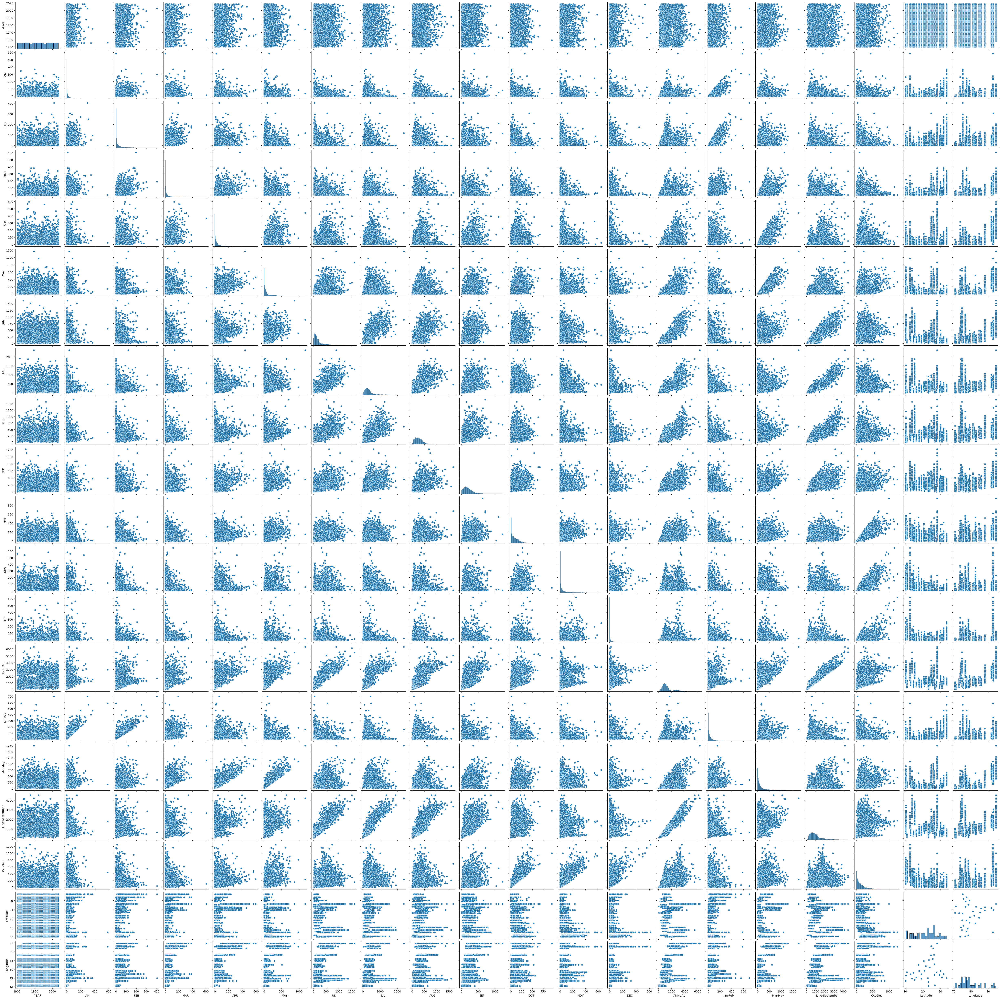

In [14]:
sns.pairplot(df)

C:\Users\faiza\AppData\Local\Temp\ipykernel_27672\3517735602.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True)


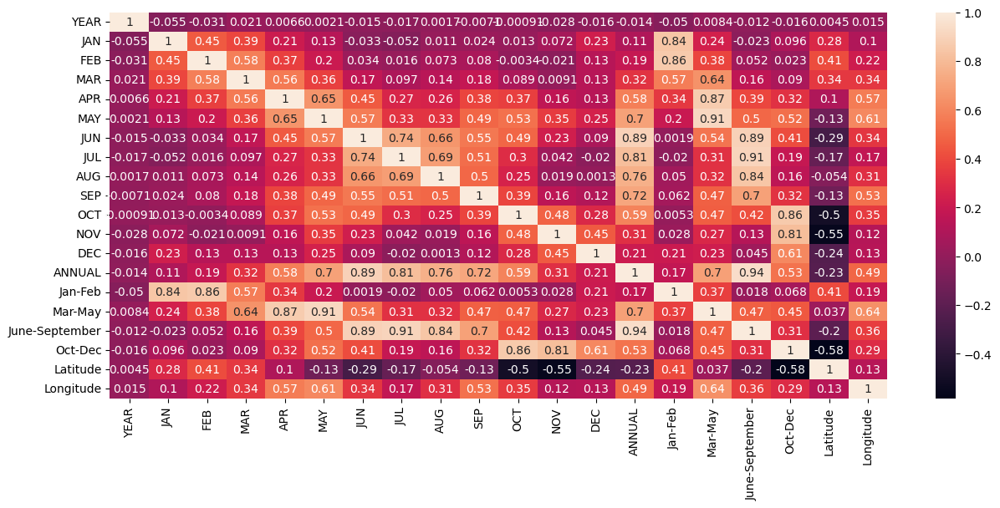

In [15]:
plt.figure(figsize=(15,6))
sns.heatmap(df.corr(),annot=True)
plt.show()

The above heatmap shows the coorelation between different features in the dataset

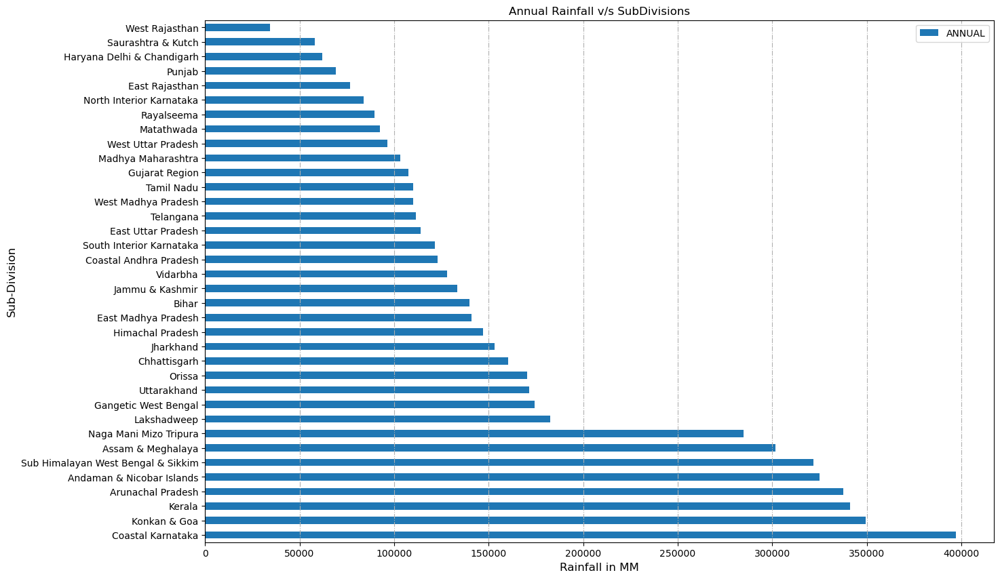

In [16]:
df[["SUBDIVISION","ANNUAL"]].groupby("SUBDIVISION").sum().sort_values(by='ANNUAL',ascending=False).plot(kind='barh',stacked=True,figsize=(15,10))
plt.xlabel("Rainfall in MM",size=12)
plt.ylabel("Sub-Division",size=12)
plt.title("Annual Rainfall v/s SubDivisions")
plt.grid(axis="x",linestyle="-.")
plt.show()

C:\Users\faiza\AppData\Local\Temp\ipykernel_27672\2776339995.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df.groupby("YEAR").sum()['ANNUAL'].plot(kind="line",color="r",marker=".")


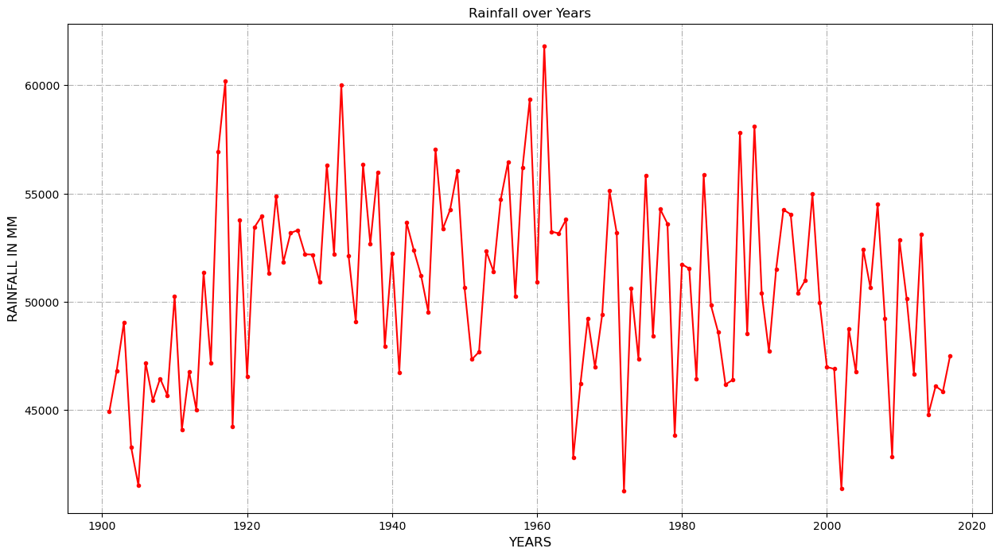

In [17]:
plt.figure(figsize=(15,8))
df.groupby("YEAR").sum()['ANNUAL'].plot(kind="line",color="r",marker=".")
plt.xlabel("YEARS",size=12)
plt.ylabel("RAINFALL IN MM",size=12)
plt.grid(axis="both",linestyle="-.")
plt.title("Rainfall over Years")
plt.show()

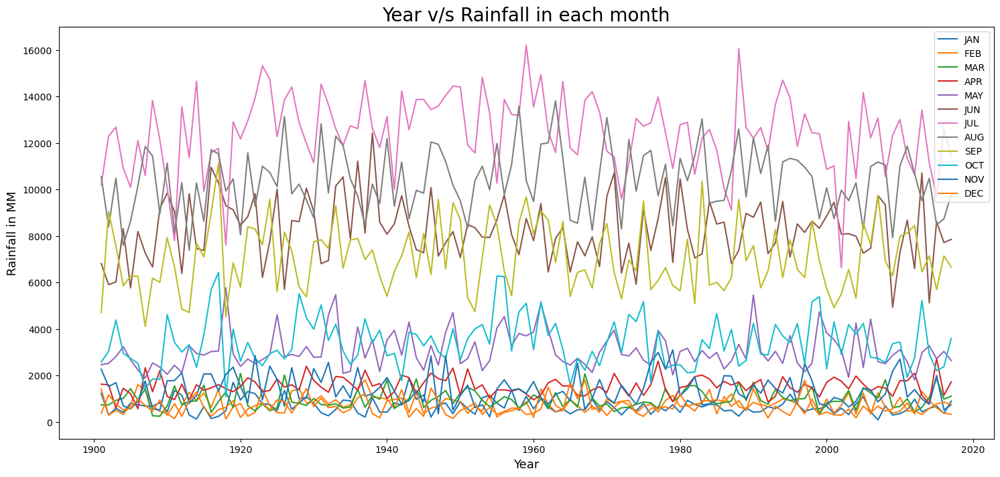

In [18]:
df[['YEAR', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL','AUG', 'SEP',
      'OCT', 'NOV', 'DEC']].groupby("YEAR").sum().plot(kind="line",figsize=(18,8))
plt.xlabel("Year",size=13)
plt.ylabel("Rainfall in MM",size=13)
plt.title("Year v/s Rainfall in each month",size=20)
plt.show()

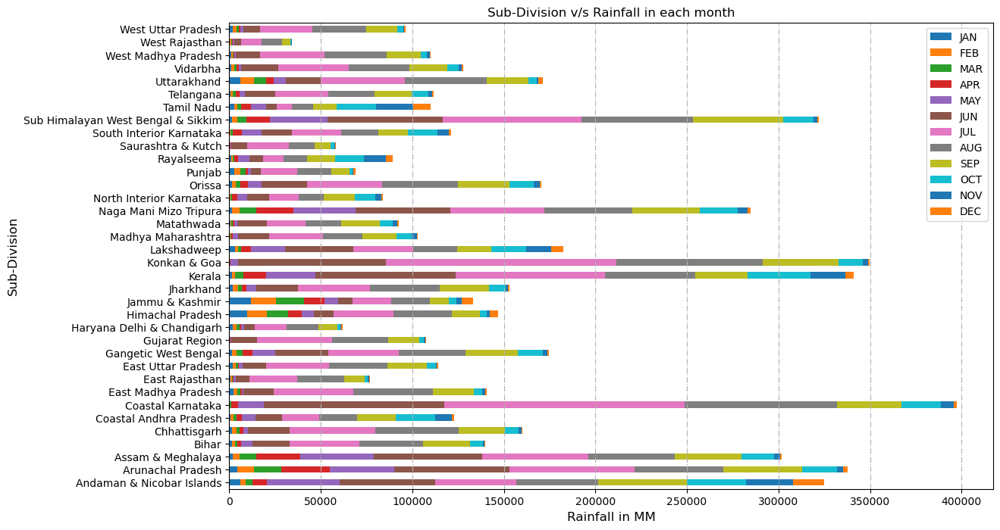

In [19]:
df[['SUBDIVISION', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].groupby("SUBDIVISION").sum().plot(kind="barh",stacked=True,figsize=(13,8))
plt.title("Sub-Division v/s Rainfall in each month")
plt.xlabel("Rainfall in MM",size=12)
plt.ylabel("Sub-Division",size=12)
plt.grid(axis="x",linestyle="-.")
plt.show()

Analysis of rainfall data of Kerala

In [20]:
V = df.loc[((df['SUBDIVISION'] == 'Kerala'))]
V.head(5)

,Name,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,...,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,June-September,Oct-Dec,Latitude,Longitude
3955,ROW3956,Kerala,1901,28.7,44.7,51.6,160.0,174.7,824.6,743.0,...,266.9,350.8,48.4,3248.6,73.4,386.3,2122.8,666.1,10.35287,76.51204
3956,ROW3957,Kerala,1902,6.7,2.6,57.3,83.9,134.5,390.9,1205.0,...,358.4,158.3,121.5,3326.5,9.3,275.7,2403.3,638.2,10.35287,76.51204
3957,ROW3958,Kerala,1903,3.2,18.6,3.1,83.6,249.7,558.6,1022.5,...,354.1,157.0,59.0,3271.4,21.8,336.4,2343.1,570.1,10.35287,76.51204
3958,ROW3959,Kerala,1904,23.7,3.0,32.2,71.5,235.7,1098.2,725.5,...,328.1,33.9,3.3,3129.6,26.7,339.4,2398.2,365.3,10.35287,76.51204
3959,ROW3960,Kerala,1905,1.2,22.3,9.4,105.9,263.3,850.2,520.5,...,383.5,74.4,0.2,2741.7,23.5,378.6,1881.5,458.1,10.35287,76.51204


In [21]:
V.tail()

,Name,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,...,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,June-September,Oct-Dec,Latitude,Longitude
4067,ROW4068,Kerala,2013,3.9,40.1,49.9,49.3,119.3,1042.7,830.2,...,259.9,154.9,17.0,3255.5,44.0,218.5,2561.2,431.8,10.35287,76.51204
4068,ROW4069,Kerala,2014,4.6,10.3,17.9,95.7,251.0,454.4,677.8,...,355.5,99.5,47.2,3046.6,14.9,364.6,2164.9,502.2,10.35287,76.51204
4069,ROW4070,Kerala,2015,3.1,5.8,50.1,214.1,201.8,563.6,406.0,...,308.1,223.6,79.4,2600.7,8.9,466.0,1514.7,611.1,10.35287,76.51204
4070,ROW4071,Kerala,2016,3.0,16.4,22.4,33.3,258.4,595.7,441.5,...,105.1,57.9,22.0,1870.8,19.4,314.1,1352.3,185.0,10.35287,76.51204
4071,ROW4072,Kerala,2017,12.7,0.3,87.8,52.8,213.3,579.8,378.5,...,228.0,152.1,61.4,2664.8,13.0,353.9,1856.4,441.5,10.35287,76.51204


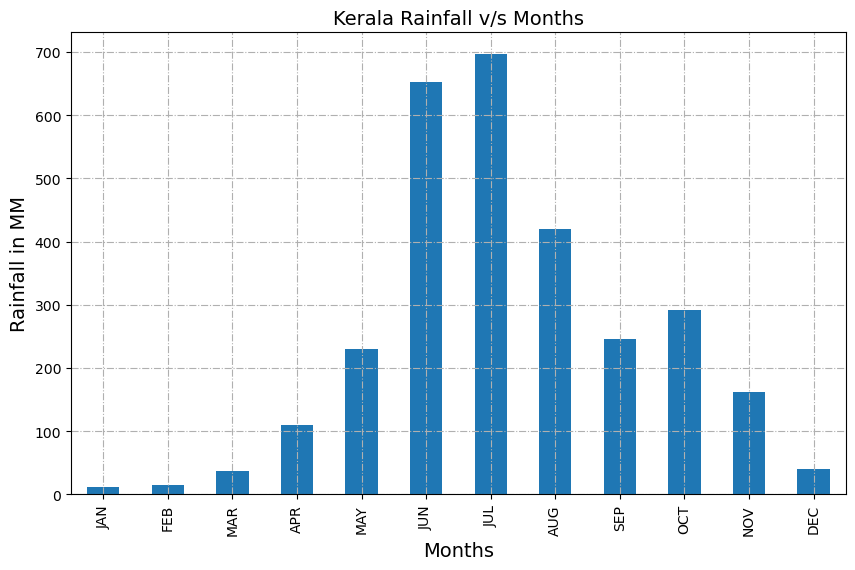

In [22]:
plt.figure(figsize=(10,6))
V[['JAN', 'FEB', 'MAR', 'APR','MAY', 'JUN','JUL','AUG', 'SEP', 'OCT','NOV','DEC']].mean().plot(kind="bar",width=0.5,linewidth=2)
plt.title("Kerala Rainfall v/s Months",size=14)
plt.xlabel("Months",size=14)
plt.ylabel("Rainfall in MM",size=14)
plt.grid(axis="both",linestyle="-.")
plt.show()

C:\Users\faiza\AppData\Local\Temp\ipykernel_27672\1009436299.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  V.groupby("YEAR").sum()['ANNUAL'].plot(ylim=(10,5000),color='r',marker='o',linestyle='-',linewidth=2,figsize=(20,8));


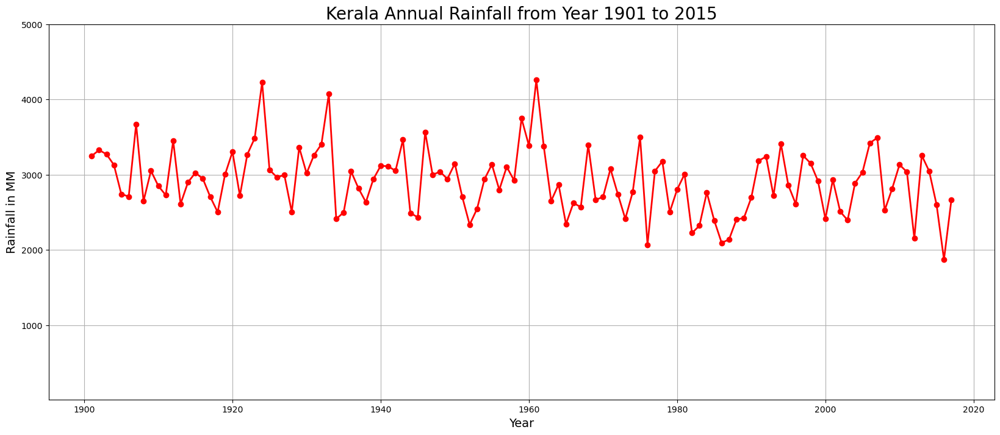

In [23]:
V.groupby("YEAR").sum()['ANNUAL'].plot(ylim=(10,5000),color='r',marker='o',linestyle='-',linewidth=2,figsize=(20,8));
plt.xlabel('Year',size=14)
plt.ylabel('Rainfall in MM',size=14)
plt.title('Kerala Annual Rainfall from Year 1901 to 2015',size=20)
plt.grid()
plt.show()

From the Above graph we observe that:- (1) The lowest rainfall in Jharkhand was noted in 2014 (2) The highest Rainfall was noted in 1961

# Modelling

In [24]:
df["SUBDIVISION"].nunique()

36

In [25]:
group = df.groupby('SUBDIVISION')['YEAR','JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']
df=group.get_group(('Kerala'))
df.head()

C:\Users\faiza\AppData\Local\Temp\ipykernel_27672\688958909.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  group = df.groupby('SUBDIVISION')['YEAR','JAN','FEB','MAR','APR','MAY','JUN','JUL','AUG','SEP','OCT','NOV','DEC']


,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
3955,1901,28.7,44.7,51.6,160.0,174.7,824.6,743.0,357.5,197.7,266.9,350.8,48.4
3956,1902,6.7,2.6,57.3,83.9,134.5,390.9,1205.0,315.8,491.6,358.4,158.3,121.5
3957,1903,3.2,18.6,3.1,83.6,249.7,558.6,1022.5,420.2,341.8,354.1,157.0,59.0
3958,1904,23.7,3.0,32.2,71.5,235.7,1098.2,725.5,351.8,222.7,328.1,33.9,3.3
3959,1905,1.2,22.3,9.4,105.9,263.3,850.2,520.5,293.6,217.2,383.5,74.4,0.2


In [26]:
df2=df.melt(['YEAR']).reset_index()
df2.head()

,index,YEAR,variable,value
0,0,1901,JAN,28.7
1,1,1902,JAN,6.7
2,2,1903,JAN,3.2
3,3,1904,JAN,23.7
4,4,1905,JAN,1.2


In [27]:
df2= df2[['YEAR','variable','value']].reset_index().sort_values(by=['YEAR','index'])
df2.head()

,index,YEAR,variable,value
0,0,1901,JAN,28.7
117,117,1901,FEB,44.7
234,234,1901,MAR,51.6
351,351,1901,APR,160.0
468,468,1901,MAY,174.7


In [28]:
df2.YEAR.unique()

array([1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911,
       1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922,
       1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933,
       1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944,
       1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955,
       1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966,
       1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977,
       1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988,
       1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999,
       2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017], dtype=int64)

In [29]:
df2.columns=['Index','Year','Month','Avg_Rainfall']

In [30]:
df2.head()

,Index,Year,Month,Avg_Rainfall
0,0,1901,JAN,28.7
117,117,1901,FEB,44.7
234,234,1901,MAR,51.6
351,351,1901,APR,160.0
468,468,1901,MAY,174.7


In [31]:
Month_map={'JAN':1,'FEB':2,'MAR' :3,'APR':4,'MAY':5,'JUN':6,'JUL':7,'AUG':8,'SEP':9,
   'OCT':10,'NOV':11,'DEC':12}
df2['Month']=df2['Month'].map(Month_map)
df2.head(12)

,Index,Year,Month,Avg_Rainfall
0,0,1901,1,28.7
117,117,1901,2,44.7
234,234,1901,3,51.6
351,351,1901,4,160.0
468,468,1901,5,174.7
585,585,1901,6,824.6
702,702,1901,7,743.0
819,819,1901,8,357.5
936,936,1901,9,197.7
1053,1053,1901,10,266.9


In [32]:
df2.drop(columns="Index",inplace=True)

In [33]:
df2.head(2)

,Year,Month,Avg_Rainfall
0,1901,1,28.7
117,1901,2,44.7


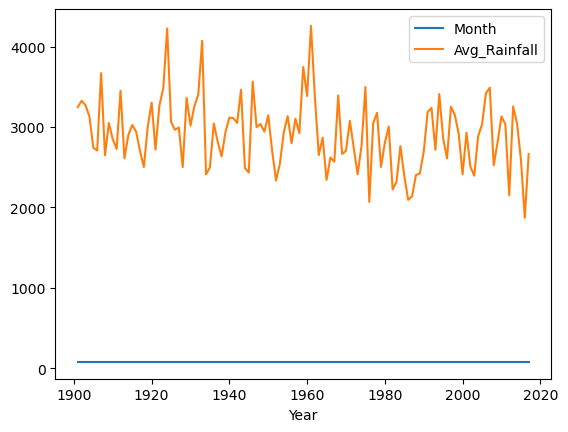

In [34]:
df2.groupby("Year").sum().plot()
plt.show()

In [35]:
X=np.asanyarray(df2[['Year','Month']]).astype('int')
y=np.asanyarray(df2['Avg_Rainfall']).astype('int')

In [36]:
X

array([[1901,    1],
       [1901,    2],
       [1901,    3],
       ...,
       [2017,   10],
       [2017,   11],
       [2017,   12]])

In [37]:
X[:15]

array([[1901,    1],
       [1901,    2],
       [1901,    3],
       [1901,    4],
       [1901,    5],
       [1901,    6],
       [1901,    7],
       [1901,    8],
       [1901,    9],
       [1901,   10],
       [1901,   11],
       [1901,   12],
       [1902,    1],
       [1902,    2],
       [1902,    3]])

In [38]:
y

array([ 28,  44,  51, ..., 228, 152,  61])

In [39]:
print(X.shape)
print(y.shape)

(1404, 2)
(1404,)


In [40]:
# splitting the dataset into training and testing
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [41]:
X_train

array([[1952,    2],
       [2009,    3],
       [1996,    3],
       ...,
       [1944,   12],
       [1996,   10],
       [2008,    6]])

In [42]:
y_train

array([ 48,  62,  14, ...,  89, 294, 469])

# Linear Regression Model

In [43]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(X_train,y_train)

LinearRegression()

In [44]:
# predicting 
y_train_predict=LR.predict(X_train)
y_test_predict=LR.predict(X_test)

In [45]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))
print('Explained Variance Score:', metrics.explained_variance_score(y_test, y_test_predict),2)

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

print("\n-----Training Accuracy-------")
print(round(LR.score(X_train,y_train),3)*100)
print("-----Testing Accuracy--------")
print(round(LR.score(X_test,y_test),3)*100)

-------Test Data--------
MAE: 195.10491071216768
MSE: 65763.71188964514
RMSE: 256.44436412143114
Explained Variance Score: 0.05391053845710658 2

-------Train Data--------
MAE: 190.58832627161715
MSE: 61579.11352310092
RMSE: 248.15139234568264

-----Training Accuracy-------
5.0
-----Testing Accuracy--------
4.5


In [46]:
predicted = LR.predict([[2014,2]])

In [47]:
predicted

array([149.11912058])

# Random Forest Model

In [49]:
from sklearn.ensemble import RandomForestRegressor
random_forest_model = RandomForestRegressor(max_depth=100, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, n_estimators=800)
random_forest_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=100, max_features='sqrt', min_samples_leaf=4,
                      min_samples_split=10, n_estimators=800)

In [50]:
y_train_predict=random_forest_model.predict(X_train)
y_test_predict=random_forest_model.predict(X_test)

In [51]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 81.07330576537561
MSE: 14387.404766033404
RMSE: 119.94750837776249

-------Train Data--------
MAE: 66.6176827299106
MSE: 10698.389965100767
RMSE: 103.43302163767994


In [52]:
print("-----------Training Accuracy------------")
print(round(random_forest_model.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(random_forest_model.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
83.5
-----------Testing Accuracy------------
79.10000000000001


In [53]:
predicted = random_forest_model.predict([[2014,2]])

In [54]:
predicted

array([22.3577202])

In [55]:
predicted = random_forest_model.predict([[2001,3]])

In [56]:
predicted

array([30.04118899])

# SVM

In [57]:
from sklearn import svm
svm_regr = svm.SVC(kernel='rbf')
svm_regr.fit(X_train, y_train)

SVC()

In [58]:
y_train_predict=svm_regr.predict(X_train)
y_test_predict=svm_regr.predict(X_test)

In [59]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 261.30604982206404
MSE: 137111.6975088968
RMSE: 370.2859672049385

-------Train Data--------
MAE: 237.68032056990205
MSE: 121306.83259127337
RMSE: 348.2913042142645


In [60]:
print("-----------Training Accuracy------------")
print(round(svm_regr.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(svm_regr.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
2.6
-----------Testing Accuracy------------
2.1


# Logistic Regression

In [62]:
from sklearn.linear_model import LogisticRegression
# logreg = LogisticRegression(random_state=0,solver='lbfgs',class_weight='balanced', max_iter=10000)
logreg = LogisticRegression(random_state=0,solver='lbfgs')
logreg.fit(X_train,y_train)

C:\Users\faiza\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=0)

In [63]:
y_train_predict=logreg.predict(X_train)
y_test_predict=logreg.predict(X_test)

In [64]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 258.37010676156586
MSE: 133769.43060498222
RMSE: 365.74503496969334

-------Train Data--------
MAE: 234.9626001780944
MSE: 117680.80053428317
RMSE: 343.04635333185394


In [65]:
print("-----------Training Accuracy------------")
print(round(logreg.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(logreg.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
2.6
-----------Testing Accuracy------------
2.1


# xgboost

In [66]:
from xgboost import XGBRegressor
xgb = XGBRegressor()
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [67]:
y_train_predict=xgb.predict(X_train)
y_test_predict=xgb.predict(X_test)

In [68]:
print("-------Test Data--------")
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

print("\n-------Train Data--------")
print('MAE:', metrics.mean_absolute_error(y_train,y_train_predict))
print('MSE:', metrics.mean_squared_error(y_train, y_train_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_predict)))

-------Test Data--------
MAE: 95.41683567031635
MSE: 19834.151827513877
RMSE: 140.83377374590896

-------Train Data--------
MAE: 26.982199308118275
MSE: 1592.353433117161
RMSE: 39.90430344107213


In [69]:
print("-----------Training Accuracy------------")
print(round(xgb.score(X_train,y_train),3)*100)
print("-----------Testing Accuracy------------")
print(round(xgb.score(X_test,y_test),3)*100)

-----------Training Accuracy------------
97.5
-----------Testing Accuracy------------
71.2
